In [11]:
%pip install gymnasium[classic-control]
%pip install pyglet

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple, https://pypi.garenanow.com/
You should consider upgrading via the '/Users/john.zhang/.pyenv/versions/3.9.13/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.
Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple, https://pypi.garenanow.com/
You should consider upgrading via the '/Users/john.zhang/.pyenv/versions/3.9.13/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [1]:
import collections
import gym
import numpy as np
import statistics
import tensorflow as tf
import tqdm

from matplotlib import pyplot as plt
from tensorflow.keras import layers
from typing import Any, List, Sequence, Tuple


# Create the environment
env = gym.make("CartPole-v1")

# Set seed for experiment reproducibility
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)

# Small epsilon value for stabilizing division operations
eps = np.finfo(np.float32).eps.item()

2025-04-02 09:14:15.517033: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


# The Actor-Critic Algorithm
actor and critic share the same input and common parameters $\theta$

actor output: action probabilities $\pi_\theta(a|s_t)$

critic output: value of the state $V^\pi_\theta(s_t)$

discounted return at time step $t$: $G_{t} = \sum^{T}_{t'=t} \gamma^{t'-t}r_{t'}$

actor loss: $L_{actor} = -\sum^{T}_{t=1} \log_\theta(\pi(a_t|s_t))(G_t - V^\pi_\theta(s_t)) $

critic loss $L_{critic} = L_{hubber}(G, V^\pi_\theta)$

total loss: $L = L_{actor} + L_{critic}$

hpyerparameters for training: <br>
$\gamma$: discount factor <br>
$\alpha$: learning rate <br>
$\beta$: learning rate for critic <br>

## Actor-Critic Model
share a common input: state 

share a common parameter layer

In [2]:

class ActorCritic(tf.keras.Model):
    def __init__(self, n_actions: int, n_hidden_units: int = 128):
        super().__init__()

        self.n_actions = n_actions
        self.common = tf.keras.layers.Dense(n_hidden_units, activation="relu")  # Common network
        # self.actor = tf.keras.layers.Dense(n_actions, activation="softmax")  # Actor network, ouput: action probabilities
        self.actor = tf.keras.layers.Dense(n_actions)  # Actor network, ouput: action logits
        self.critic = tf.keras.layers.Dense(1)  # Critic network, output: state value
        
    def call(self, states: tf.Tensor) -> Tuple[tf.Tensor, tf.Tensor]:
        x = self.common(states)
        return self.actor(x), self.critic(x)  


In [3]:
num_actions = env.action_space.n  # 2
num_hidden_units = 128

model = ActorCritic(num_actions, num_hidden_units)

In [4]:
num_actions

2

# Train the agent
To train the agent, you will follow these steps:

1. Run the agent on the environment to collect training data per episode.
2. Compute expected return at each time step.
3. Compute the loss for the combined Actor-Critic model.
4. Compute gradients and update network parameters.
5. Repeat 1-4 until either success criterion or max episodes has been reached.


In [ ]:
# Wrap Gym's `env.step` call as an operation in a TensorFlow function.
# This would allow it to be included in a callable TensorFlow graph.
# or else  AssertionError: <tf.Tensor: shape=(), dtype=int64, numpy=0> (<class 'tensorflow.python.framework.ops.EagerTensor'>) invalid

@tf.numpy_function(Tout=[tf.float32, tf.int32, tf.int32])
def env_step(action: np.ndarray) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """Returns (state, reward, done, info)"""
    state, reward, done, truncated, info = env.step(action)
    return (state.astype(np.float32),
          np.array(reward, np.int32),
          np.array(done, np.int32))

In [6]:
# run episode to collect data: action_probs, values, rewards
def run_episode(
        env,
        actor_critic_model: tf.keras.Model, 
        max_steps=1000) -> Tuple[tf.Tensor, tf.Tensor, tf.Tensor]:

    action_probs_arr = tf.TensorArray(dtype=tf.float32, size=0, dynamic_size=True)
    values_arr = tf.TensorArray(dtype=tf.float32, size=0, dynamic_size=True)
    rewards_arr = tf.TensorArray(dtype=tf.int32, size=0, dynamic_size=True)

    done = False


    state, _ = env.reset()
    initial_state_shape = state.shape

    #  NotImplementedError: break and return statements which depend on a TF condition are not supported in Python for loops. 
    #  Did you intend to make it a TF loop?
    # for t in range(max_steps):
    for t in tf.range(max_steps):
        
        # Convert state into a batched tensor (batch size = 1) 
        state = tf.expand_dims(state, 0)

        # Run the model and to get action probabilities and critic value
        action_logits_t, value = actor_critic_model(state)

        # Store critic values
        # squeeze: remove batch dimension
        values_arr = values_arr.write(t, tf.squeeze(value))  

        # Sample 1 action from action probability distribution
        # [0, 0]: [batch_size, num_samples]
        action = tf.random.categorical(action_logits_t, 1)[0, 0]
        action_probs_t = tf.nn.softmax(action_logits_t)

        # Store log probability of the action chosen
        # \pi_\theta(a_t|s_t)
        # print(f"action_probs={action_probs}")
        action_probs_arr = action_probs_arr.write(t, action_probs_t[0, action]) # select the probability of the chosen action

        # Run step in the environment
        state, reward, done = env_step(action)
                
        # ValueError: 'state' has shape (4,) before the loop, 
        # but shape <unknown> after one iteration. 
        # Use tf.autograph.experimental.set_loop_options to set shape invariants.
        print(f"state={state.shape}")
        print(f"initial_state_shape={initial_state_shape}")
        state.set_shape(initial_state_shape)

        rewards_arr = rewards_arr.write(t, reward)

        if tf.cast(done, tf.bool):
            break
        
    return (action_probs_arr.stack(), values_arr.stack(), rewards_arr.stack())

## Compute expected returns
discounted return at time step $t$: $G_{t} = \sum^{T}_{t'=t} \gamma^{t'-t}r_{t'}$

In [7]:
def get_returns(rewards, gamma=0.99, standardize=True):
    returns = []
    R = 0
    for r in reversed(rewards):
        R = r + gamma * R
        returns.insert(0, R)

    if standardize:
        returns = (returns - np.mean(returns)) / (np.std(returns) + 1e-8)
    return returns[::-1] # reverse back to original order

In [8]:
def get_expected_return(
    rewards: tf.Tensor,
    gamma: float,
    standardize: bool = True) -> tf.Tensor:
  """Compute expected returns per timestep."""

  # print(f"rewards.shape={tf.shape(rewards.shape)}")
  n = tf.shape(rewards)[0]
  returns = tf.TensorArray(dtype=tf.float32, size=n)

  # Start from the end of `rewards` and accumulate reward sums
  # into the `returns` array
  rewards = tf.cast(rewards[::-1], dtype=tf.float32) # start from the end
  discounted_sum = tf.constant(0.0)
  discounted_sum_shape = discounted_sum.shape
  for i in tf.range(n):
    reward = rewards[i]
    discounted_sum = reward + gamma * discounted_sum
    discounted_sum.set_shape(discounted_sum_shape) # why do we need this?
    returns = returns.write(i, discounted_sum)
  returns = returns.stack()[::-1] # reverse back

  if standardize:
    returns = ((returns - tf.math.reduce_mean(returns)) /
               (tf.math.reduce_std(returns) + eps))

  return returns

## Compute loss

actor loss: $L_{actor} = -\sum^{T}_{t=1} \log\pi_\theta(a_t|s_t)(G_t - V^\pi_\theta(s_t)) $

critic loss $L_{critic} = L_{hubber}(G, V^\pi_\theta)$

total loss: $L = L_{actor} + L_{critic}$

In [9]:
huber_loss = tf.keras.losses.Huber(reduction=tf.keras.losses.Reduction.SUM)

# Compute the loss
def compute_loss(action_prob: tf.Tensor, 
                 values: tf.Tensor, 
                 returns: tf.Tensor) -> tf.Tensor:
    
    advantage = returns - values
    actor_loss = - tf.reduce_sum(tf.math.log(action_prob) * advantage)

    critic_loss = huber_loss(values, returns)
    
    return actor_loss + critic_loss

# Define the training loop

In [10]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)

# Training loop
# @tf.function
def train_step(model: tf.keras.Model, 
               gamma=0.99, 
               max_steps=1000) -> tf.Tensor:
    with tf.GradientTape() as tape:
        
        # Run the model for one episode to collect training data
        action_probs, values, rewards = run_episode(env, model, max_steps)

        # Calculate expected returns
        # rewards is tf.Tensor, convert to numpy array in case of the following error:
        # TypeError: len is not well defined for a symbolic Tensor (TensorArrayV2Stack_2/TensorListStack:0). 
        # Please call `x.shape` rather than `len(x)` for shape information.
        # AttributeError: 'SymbolicTensor' object has no attribute 'numpy'
        # returns = get_returns(rewards.numpy(), gamma)
        returns = get_expected_return(rewards, gamma)
        
        # Convert training data to appropriate TF tensors
        action_probs, values, returns = [
            tf.expand_dims(x, 1) for x in [action_probs, values, returns]]
        
        # Compute the loss values to update our network
        loss = compute_loss(action_probs, values, returns)

    # Compute the gradients from the loss
    grads = tape.gradient(loss, model.trainable_variables)

    optimizer.apply_gradients(zip(grads, model.trainable_variables))

    episode_reward = tf.math.reduce_sum(rewards)
    return episode_reward


# Running the loop

In [14]:
%%time

min_episodes_criterion = 100
max_episodes = 10000
max_steps_per_episode = 500

# `CartPole-v1` is considered solved if average reward is >= 475 over 500
# consecutive trials
reward_threshold = 475
running_reward = 0

# The discount factor for future rewards
gamma = 0.99

# Keep the last episodes reward
episodes_reward: collections.deque = collections.deque(maxlen=min_episodes_criterion) # what does this do?

t = tqdm.trange(max_episodes)
for i in t:
    initial_state, info = env.reset()
    initial_state = tf.constant(initial_state, dtype=tf.float32)
    episode_reward = int(train_step(model, gamma, max_steps_per_episode))

    episodes_reward.append(episode_reward)
    running_reward = statistics.mean(episodes_reward)


    t.set_postfix(
        episode_reward=episode_reward, running_reward=running_reward)

    # Show the average episode reward every 10 episodes
    if i % 10 == 0:
      pass # print(f'Episode {i}: average reward: {avg_reward}')

    if running_reward > reward_threshold and i >= min_episodes_criterion:
        break

print(f'\nSolved at episode {i}: average reward: {running_reward:.2f}!')

  0%|          | 0/10000 [00:00<?, ?it/s]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  0%|          | 1/10000 [00:00<45:26,  3.67it/s, episode_reward=16, running_reward=16]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  0%|          | 2/10000 [00:00<53:28,  3.12it/s, episode_reward=29, running_reward=22.5]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 3/10000 [00:00<51:26,  3.24it/s, episode_reward=26, running_reward=23.7]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 4/10000 [00:01<1:05:41,  2.54it/s, episode_reward=53, running_reward=31]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 5/10000 [00:01<1:02:06,  2.68it/s, episode_reward=30, running_reward=30.8]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 6/10000 [00:02<1:04:30,  2.58it/s, episode_reward=40, running_reward=32.3]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 7/10000 [00:02<1:14:02,  2.25it/s, episode_reward=58, running_reward=36]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 8/10000 [00:03<1:14:30,  2.24it/s, episode_reward=46, running_reward=37.2]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 9/10000 [00:03<1:08:12,  2.44it/s, episode_reward=31, running_reward=36.6]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 10/10000 [00:04<1:23:43,  1.99it/s, episode_reward=71, running_reward=40] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 11/10000 [00:05<1:37:14,  1.71it/s, episode_reward=82, running_reward=43.8]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 12/10000 [00:05<1:38:58,  1.68it/s, episode_reward=66, running_reward=45.7]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 13/10000 [00:06<1:29:19,  1.86it/s, episode_reward=41, running_reward=45.3]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 14/10000 [00:06<1:33:13,  1.79it/s, episode_reward=65, running_reward=46.7]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 15/10000 [00:07<1:30:02,  1.85it/s, episode_reward=52, running_reward=47.1]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 16/10000 [00:07<1:38:29,  1.69it/s, episode_reward=78, running_reward=49]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 17/10000 [00:08<1:40:46,  1.65it/s, episode_reward=70, running_reward=50.2]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 18/10000 [00:09<1:46:28,  1.56it/s, episode_reward=79, running_reward=51.8]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 19/10000 [00:09<1:48:45,  1.53it/s, episode_reward=68, running_reward=52.7]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 20/10000 [00:10<1:36:39,  1.72it/s, episode_reward=42, running_reward=52.1]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 21/10000 [00:11<1:45:56,  1.57it/s, episode_reward=69, running_reward=53]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 22/10000 [00:11<1:58:22,  1.40it/s, episode_reward=87, running_reward=54.5]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 23/10000 [00:12<2:05:27,  1.33it/s, episode_reward=89, running_reward=56]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 24/10000 [00:13<2:08:18,  1.30it/s, episode_reward=81, running_reward=57]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 25/10000 [00:14<2:15:13,  1.23it/s, episode_reward=98, running_reward=58.7]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 26/10000 [00:15<2:26:44,  1.13it/s, episode_reward=94, running_reward=60]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 27/10000 [00:16<2:50:20,  1.02s/it, episode_reward=139, running_reward=63]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 28/10000 [00:17<2:22:17,  1.17it/s, episode_reward=41, running_reward=62.2]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 29/10000 [00:18<2:47:56,  1.01s/it, episode_reward=123, running_reward=64.3]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 30/10000 [00:19<2:34:29,  1.08it/s, episode_reward=65, running_reward=64.3] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 31/10000 [00:20<2:21:35,  1.17it/s, episode_reward=61, running_reward=64.2]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 32/10000 [00:20<2:08:32,  1.29it/s, episode_reward=58, running_reward=64]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 33/10000 [00:21<1:45:20,  1.58it/s, episode_reward=31, running_reward=63]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 34/10000 [00:21<1:39:15,  1.67it/s, episode_reward=37, running_reward=62.2]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 35/10000 [00:22<1:59:17,  1.39it/s, episode_reward=109, running_reward=63.6]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 36/10000 [00:23<1:46:34,  1.56it/s, episode_reward=40, running_reward=62.9] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  0%|          | 37/10000 [00:23<1:29:43,  1.85it/s, episode_reward=21, running_reward=61.8]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 38/10000 [00:23<1:20:36,  2.06it/s, episode_reward=28, running_reward=60.9]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 39/10000 [00:24<1:36:51,  1.71it/s, episode_reward=68, running_reward=61.1]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 40/10000 [00:25<1:33:36,  1.77it/s, episode_reward=47, running_reward=60.7]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 41/10000 [00:25<1:32:41,  1.79it/s, episode_reward=29, running_reward=60]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 42/10000 [00:26<2:08:07,  1.30it/s, episode_reward=80, running_reward=60.4]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 43/10000 [00:27<2:25:15,  1.14it/s, episode_reward=89, running_reward=61.1]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 44/10000 [00:28<2:15:46,  1.22it/s, episode_reward=58, running_reward=61]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 45/10000 [00:30<2:46:57,  1.01s/it, episode_reward=138, running_reward=62.7]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 46/10000 [00:30<2:32:04,  1.09it/s, episode_reward=75, running_reward=63]   

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 47/10000 [00:31<2:20:49,  1.18it/s, episode_reward=68, running_reward=63.1]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 48/10000 [00:32<2:52:05,  1.04s/it, episode_reward=102, running_reward=63.9]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  0%|          | 49/10000 [00:33<2:20:20,  1.18it/s, episode_reward=28, running_reward=63.2] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  0%|          | 50/10000 [00:33<2:08:02,  1.30it/s, episode_reward=53, running_reward=63]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 51/10000 [00:35<2:55:55,  1.06s/it, episode_reward=142, running_reward=64.5]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 52/10000 [00:36<2:39:07,  1.04it/s, episode_reward=60, running_reward=64.4] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 53/10000 [00:37<3:04:11,  1.11s/it, episode_reward=120, running_reward=65.5]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 54/10000 [00:38<2:32:34,  1.09it/s, episode_reward=40, running_reward=65]   

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 55/10000 [00:39<2:29:01,  1.11it/s, episode_reward=86, running_reward=65.4]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 56/10000 [00:40<2:24:18,  1.15it/s, episode_reward=69, running_reward=65.5]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 57/10000 [00:42<3:19:17,  1.20s/it, episode_reward=189, running_reward=67.6]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 58/10000 [00:43<3:30:32,  1.27s/it, episode_reward=161, running_reward=69.2]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 59/10000 [00:45<3:47:44,  1.37s/it, episode_reward=163, running_reward=70.8]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 60/10000 [00:48<5:16:19,  1.91s/it, episode_reward=295, running_reward=74.6]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 61/10000 [00:49<4:34:46,  1.66s/it, episode_reward=118, running_reward=75.3]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 62/10000 [00:49<3:37:24,  1.31s/it, episode_reward=42, running_reward=74.7] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 63/10000 [00:50<2:59:08,  1.08s/it, episode_reward=47, running_reward=74.3]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 64/10000 [00:50<2:26:53,  1.13it/s, episode_reward=38, running_reward=73.7]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 65/10000 [00:51<2:39:10,  1.04it/s, episode_reward=119, running_reward=74.4]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 66/10000 [00:52<2:35:38,  1.06it/s, episode_reward=107, running_reward=74.9]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 67/10000 [00:53<2:30:22,  1.10it/s, episode_reward=91, running_reward=75.2] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 68/10000 [00:54<2:11:32,  1.26it/s, episode_reward=56, running_reward=74.9]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 69/10000 [00:55<2:24:56,  1.14it/s, episode_reward=115, running_reward=75.5]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 70/10000 [00:56<2:55:52,  1.06s/it, episode_reward=146, running_reward=76.5]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 71/10000 [00:57<2:27:56,  1.12it/s, episode_reward=52, running_reward=76.1] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 72/10000 [00:58<2:44:28,  1.01it/s, episode_reward=133, running_reward=76.9]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 73/10000 [00:59<2:57:12,  1.07s/it, episode_reward=158, running_reward=78]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 74/10000 [01:00<2:48:29,  1.02s/it, episode_reward=117, running_reward=78.6]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 75/10000 [01:01<2:48:12,  1.02s/it, episode_reward=92, running_reward=78.7] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 76/10000 [01:03<3:14:46,  1.18s/it, episode_reward=134, running_reward=79.5]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 77/10000 [01:04<3:09:41,  1.15s/it, episode_reward=97, running_reward=79.7] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 78/10000 [01:04<2:47:31,  1.01s/it, episode_reward=80, running_reward=79.7]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 79/10000 [01:06<3:01:51,  1.10s/it, episode_reward=138, running_reward=80.4]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 80/10000 [01:07<2:48:57,  1.02s/it, episode_reward=70, running_reward=80.3] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 81/10000 [01:08<2:51:20,  1.04s/it, episode_reward=100, running_reward=80.5]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 82/10000 [01:08<2:40:06,  1.03it/s, episode_reward=74, running_reward=80.5] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 83/10000 [01:09<2:37:17,  1.05it/s, episode_reward=81, running_reward=80.5]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 84/10000 [01:10<2:34:52,  1.07it/s, episode_reward=90, running_reward=80.6]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 85/10000 [01:12<3:00:32,  1.09s/it, episode_reward=111, running_reward=80.9]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  1%|          | 86/10000 [01:12<2:24:41,  1.14it/s, episode_reward=28, running_reward=80.3] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 87/10000 [01:13<2:42:32,  1.02it/s, episode_reward=109, running_reward=80.7]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 88/10000 [01:15<3:26:28,  1.25s/it, episode_reward=117, running_reward=81.1]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 89/10000 [01:16<3:09:15,  1.15s/it, episode_reward=56, running_reward=80.8] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 90/10000 [01:18<3:23:43,  1.23s/it, episode_reward=98, running_reward=81]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  1%|          | 91/10000 [01:18<2:35:19,  1.06it/s, episode_reward=27, running_reward=80.4]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  1%|          | 92/10000 [01:18<2:00:37,  1.37it/s, episode_reward=26, running_reward=79.8]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 93/10000 [01:18<1:45:14,  1.57it/s, episode_reward=40, running_reward=79.4]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 94/10000 [01:19<1:30:32,  1.82it/s, episode_reward=31, running_reward=78.9]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 95/10000 [01:20<2:07:40,  1.29it/s, episode_reward=116, running_reward=79.2]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 96/10000 [01:21<2:26:10,  1.13it/s, episode_reward=120, running_reward=79.7]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 97/10000 [01:22<2:07:33,  1.29it/s, episode_reward=50, running_reward=79.4] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 98/10000 [01:22<1:52:52,  1.46it/s, episode_reward=48, running_reward=79]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 99/10000 [01:24<2:45:32,  1.00s/it, episode_reward=164, running_reward=79.9]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 100/10000 [01:26<3:11:53,  1.16s/it, episode_reward=163, running_reward=80.7]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 101/10000 [01:28<4:08:55,  1.51s/it, episode_reward=196, running_reward=82.5]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 102/10000 [01:29<3:57:06,  1.44s/it, episode_reward=128, running_reward=83.5]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 103/10000 [01:30<3:38:24,  1.32s/it, episode_reward=121, running_reward=84.5]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 104/10000 [01:31<3:25:15,  1.24s/it, episode_reward=123, running_reward=85.2]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 105/10000 [01:32<3:13:03,  1.17s/it, episode_reward=115, running_reward=86]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 106/10000 [01:33<2:39:27,  1.03it/s, episode_reward=51, running_reward=86.1]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 107/10000 [01:34<2:35:33,  1.06it/s, episode_reward=100, running_reward=86.5]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 108/10000 [01:34<2:25:00,  1.14it/s, episode_reward=82, running_reward=86.9] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 109/10000 [01:35<2:28:03,  1.11it/s, episode_reward=103, running_reward=87.6]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 110/10000 [01:36<2:25:46,  1.13it/s, episode_reward=98, running_reward=87.9] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 111/10000 [01:37<2:27:44,  1.12it/s, episode_reward=93, running_reward=88]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 112/10000 [01:39<3:00:37,  1.10s/it, episode_reward=178, running_reward=89.1]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 113/10000 [01:40<2:57:22,  1.08s/it, episode_reward=116, running_reward=89.9]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 114/10000 [01:40<2:43:02,  1.01it/s, episode_reward=95, running_reward=90.2] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 115/10000 [01:42<2:58:33,  1.08s/it, episode_reward=133, running_reward=91] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 116/10000 [01:43<2:52:22,  1.05s/it, episode_reward=117, running_reward=91.4]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 117/10000 [01:45<3:56:49,  1.44s/it, episode_reward=222, running_reward=92.9]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 118/10000 [01:47<4:44:23,  1.73s/it, episode_reward=219, running_reward=94.3]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 119/10000 [01:50<5:29:16,  2.00s/it, episode_reward=202, running_reward=95.6]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 120/10000 [01:51<4:56:07,  1.80s/it, episode_reward=142, running_reward=96.6]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 121/10000 [01:53<4:34:02,  1.66s/it, episode_reward=140, running_reward=97.3]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 122/10000 [01:54<4:27:21,  1.62s/it, episode_reward=164, running_reward=98.1]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 123/10000 [01:58<6:09:32,  2.24s/it, episode_reward=410, running_reward=101] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|          | 124/10000 [02:02<7:49:51,  2.85s/it, episode_reward=500, running_reward=106]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 125/10000 [02:05<7:21:31,  2.68s/it, episode_reward=261, running_reward=107]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 126/10000 [02:09<8:59:02,  3.28s/it, episode_reward=500, running_reward=111]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 127/10000 [02:12<8:37:42,  3.15s/it, episode_reward=317, running_reward=113]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 128/10000 [02:16<9:02:28,  3.30s/it, episode_reward=371, running_reward=116]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 129/10000 [02:20<10:07:15,  3.69s/it, episode_reward=500, running_reward=120]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 130/10000 [02:24<10:12:29,  3.72s/it, episode_reward=389, running_reward=123]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 131/10000 [02:29<11:09:26,  4.07s/it, episode_reward=500, running_reward=128]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 132/10000 [02:31<9:44:04,  3.55s/it, episode_reward=254, running_reward=130] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 133/10000 [02:36<10:37:23,  3.88s/it, episode_reward=500, running_reward=134]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 134/10000 [02:40<10:32:40,  3.85s/it, episode_reward=392, running_reward=138]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 135/10000 [02:43<9:48:33,  3.58s/it, episode_reward=337, running_reward=140] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 136/10000 [02:47<10:39:14,  3.89s/it, episode_reward=500, running_reward=145]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 137/10000 [02:52<10:55:37,  3.99s/it, episode_reward=500, running_reward=150]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 138/10000 [02:57<11:51:20,  4.33s/it, episode_reward=500, running_reward=154]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 139/10000 [03:02<12:17:13,  4.49s/it, episode_reward=500, running_reward=159]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 140/10000 [03:06<12:38:33,  4.62s/it, episode_reward=500, running_reward=163]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 141/10000 [03:11<12:35:22,  4.60s/it, episode_reward=500, running_reward=168]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 142/10000 [03:15<12:21:25,  4.51s/it, episode_reward=500, running_reward=172]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 143/10000 [03:20<12:23:27,  4.53s/it, episode_reward=500, running_reward=176]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 144/10000 [03:25<12:30:16,  4.57s/it, episode_reward=500, running_reward=181]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 145/10000 [03:29<12:40:49,  4.63s/it, episode_reward=500, running_reward=184]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 146/10000 [03:34<12:38:56,  4.62s/it, episode_reward=500, running_reward=188]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 147/10000 [03:38<12:22:01,  4.52s/it, episode_reward=500, running_reward=193]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 148/10000 [03:42<12:06:06,  4.42s/it, episode_reward=500, running_reward=197]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  1%|▏         | 149/10000 [03:47<12:05:37,  4.42s/it, episode_reward=500, running_reward=201]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 150/10000 [03:52<12:28:24,  4.56s/it, episode_reward=500, running_reward=206]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 151/10000 [03:56<12:38:59,  4.62s/it, episode_reward=500, running_reward=210]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 152/10000 [04:01<12:45:58,  4.67s/it, episode_reward=500, running_reward=214]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 153/10000 [04:06<12:49:25,  4.69s/it, episode_reward=500, running_reward=218]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 154/10000 [04:09<11:36:44,  4.25s/it, episode_reward=356, running_reward=221]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 155/10000 [04:13<11:10:10,  4.08s/it, episode_reward=422, running_reward=224]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 156/10000 [04:15<9:51:04,  3.60s/it, episode_reward=269, running_reward=226] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 157/10000 [04:18<9:01:41,  3.30s/it, episode_reward=294, running_reward=227]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 158/10000 [04:20<8:06:22,  2.97s/it, episode_reward=249, running_reward=228]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 159/10000 [04:22<7:09:53,  2.62s/it, episode_reward=200, running_reward=229]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 160/10000 [04:24<6:29:09,  2.37s/it, episode_reward=209, running_reward=228]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 161/10000 [04:25<5:48:32,  2.13s/it, episode_reward=174, running_reward=228]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 162/10000 [04:26<4:55:07,  1.80s/it, episode_reward=125, running_reward=229]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 163/10000 [04:28<4:44:55,  1.74s/it, episode_reward=181, running_reward=230]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 164/10000 [04:30<4:51:35,  1.78s/it, episode_reward=209, running_reward=232]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 165/10000 [04:31<4:08:00,  1.51s/it, episode_reward=109, running_reward=232]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 166/10000 [04:32<3:46:13,  1.38s/it, episode_reward=125, running_reward=232]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 167/10000 [04:33<3:30:00,  1.28s/it, episode_reward=128, running_reward=233]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 168/10000 [04:34<3:35:05,  1.31s/it, episode_reward=174, running_reward=234]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 169/10000 [04:36<3:41:37,  1.35s/it, episode_reward=168, running_reward=234]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  2%|▏         | 170/10000 [04:36<2:45:52,  1.01s/it, episode_reward=24, running_reward=233] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 171/10000 [04:37<2:57:25,  1.08s/it, episode_reward=147, running_reward=234]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 172/10000 [04:38<2:22:56,  1.15it/s, episode_reward=41, running_reward=233] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 173/10000 [04:38<1:53:03,  1.45it/s, episode_reward=28, running_reward=232]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 174/10000 [04:38<1:34:30,  1.73it/s, episode_reward=34, running_reward=231]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 175/10000 [04:40<2:21:27,  1.16it/s, episode_reward=185, running_reward=232]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 176/10000 [04:42<3:17:49,  1.21s/it, episode_reward=228, running_reward=233]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 177/10000 [04:44<4:37:21,  1.69s/it, episode_reward=331, running_reward=235]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 178/10000 [04:48<6:16:52,  2.30s/it, episode_reward=465, running_reward=239]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 179/10000 [04:52<7:45:04,  2.84s/it, episode_reward=500, running_reward=243]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 180/10000 [04:53<6:08:53,  2.25s/it, episode_reward=91, running_reward=243] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 181/10000 [04:57<7:35:51,  2.79s/it, episode_reward=500, running_reward=247]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 182/10000 [05:01<8:36:54,  3.16s/it, episode_reward=500, running_reward=251]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 183/10000 [05:05<9:17:33,  3.41s/it, episode_reward=500, running_reward=255]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 184/10000 [05:09<9:54:36,  3.63s/it, episode_reward=500, running_reward=259]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 185/10000 [05:14<10:25:52,  3.83s/it, episode_reward=500, running_reward=263]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 186/10000 [05:18<10:38:53,  3.91s/it, episode_reward=500, running_reward=268]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 187/10000 [05:22<10:56:16,  4.01s/it, episode_reward=500, running_reward=272]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 188/10000 [05:26<11:04:01,  4.06s/it, episode_reward=500, running_reward=276]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 189/10000 [05:30<11:15:52,  4.13s/it, episode_reward=500, running_reward=280]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 190/10000 [05:35<11:14:51,  4.13s/it, episode_reward=500, running_reward=284]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 191/10000 [05:39<11:14:25,  4.13s/it, episode_reward=500, running_reward=289]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 192/10000 [05:43<11:21:31,  4.17s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 193/10000 [05:47<11:27:03,  4.20s/it, episode_reward=500, running_reward=298]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 194/10000 [05:52<11:36:27,  4.26s/it, episode_reward=500, running_reward=303]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 195/10000 [05:56<11:35:52,  4.26s/it, episode_reward=500, running_reward=307]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 196/10000 [05:59<10:52:49,  4.00s/it, episode_reward=386, running_reward=309]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 197/10000 [06:03<10:38:22,  3.91s/it, episode_reward=421, running_reward=313]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  2%|▏         | 198/10000 [06:03<7:39:14,  2.81s/it, episode_reward=19, running_reward=313]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 199/10000 [06:08<9:00:08,  3.31s/it, episode_reward=500, running_reward=316]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 200/10000 [06:12<9:48:55,  3.61s/it, episode_reward=500, running_reward=320]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 201/10000 [06:16<10:13:52,  3.76s/it, episode_reward=500, running_reward=323]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 202/10000 [06:21<10:50:41,  3.98s/it, episode_reward=500, running_reward=326]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 203/10000 [06:25<11:05:50,  4.08s/it, episode_reward=500, running_reward=330]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 204/10000 [06:29<11:09:01,  4.10s/it, episode_reward=500, running_reward=334]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 205/10000 [06:34<11:25:03,  4.20s/it, episode_reward=500, running_reward=338]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 206/10000 [06:34<8:30:53,  3.13s/it, episode_reward=67, running_reward=338]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 207/10000 [06:39<9:50:50,  3.62s/it, episode_reward=500, running_reward=342]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 208/10000 [06:44<10:52:58,  4.00s/it, episode_reward=500, running_reward=346]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 209/10000 [06:46<9:23:29,  3.45s/it, episode_reward=242, running_reward=348] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 210/10000 [06:50<9:55:49,  3.65s/it, episode_reward=500, running_reward=352]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 211/10000 [06:55<10:43:36,  3.94s/it, episode_reward=500, running_reward=356]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 212/10000 [06:59<10:54:20,  4.01s/it, episode_reward=500, running_reward=359]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 213/10000 [07:03<11:10:53,  4.11s/it, episode_reward=500, running_reward=363]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 214/10000 [07:08<11:26:45,  4.21s/it, episode_reward=500, running_reward=367]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 215/10000 [07:12<11:35:42,  4.27s/it, episode_reward=500, running_reward=370]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 216/10000 [07:15<10:12:32,  3.76s/it, episode_reward=287, running_reward=372]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 217/10000 [07:19<10:37:39,  3.91s/it, episode_reward=500, running_reward=375]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 218/10000 [07:24<11:34:36,  4.26s/it, episode_reward=500, running_reward=378]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 219/10000 [07:29<11:56:58,  4.40s/it, episode_reward=500, running_reward=381]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 220/10000 [07:33<12:09:40,  4.48s/it, episode_reward=500, running_reward=384]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 221/10000 [07:38<12:10:22,  4.48s/it, episode_reward=500, running_reward=388]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 222/10000 [07:43<12:22:17,  4.55s/it, episode_reward=500, running_reward=391]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 223/10000 [07:47<12:28:43,  4.59s/it, episode_reward=500, running_reward=392]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 224/10000 [07:52<12:36:40,  4.64s/it, episode_reward=500, running_reward=392]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 225/10000 [07:56<12:26:31,  4.58s/it, episode_reward=500, running_reward=394]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 226/10000 [08:01<12:15:18,  4.51s/it, episode_reward=500, running_reward=394]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 227/10000 [08:05<11:58:49,  4.41s/it, episode_reward=500, running_reward=396]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 228/10000 [08:09<11:56:14,  4.40s/it, episode_reward=500, running_reward=398]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 229/10000 [08:13<11:41:47,  4.31s/it, episode_reward=500, running_reward=398]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 230/10000 [08:18<11:44:22,  4.33s/it, episode_reward=500, running_reward=399]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 231/10000 [08:22<11:31:03,  4.24s/it, episode_reward=500, running_reward=399]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 232/10000 [08:26<11:25:08,  4.21s/it, episode_reward=500, running_reward=401]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 233/10000 [08:30<11:33:20,  4.26s/it, episode_reward=500, running_reward=401]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 234/10000 [08:35<11:58:39,  4.42s/it, episode_reward=500, running_reward=402]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 235/10000 [08:42<13:42:18,  5.05s/it, episode_reward=500, running_reward=404]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 236/10000 [08:46<12:59:23,  4.79s/it, episode_reward=500, running_reward=404]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 237/10000 [08:50<12:36:36,  4.65s/it, episode_reward=500, running_reward=404]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 238/10000 [08:55<12:28:16,  4.60s/it, episode_reward=500, running_reward=404]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 239/10000 [08:59<12:01:47,  4.44s/it, episode_reward=500, running_reward=404]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 240/10000 [09:02<11:21:51,  4.19s/it, episode_reward=500, running_reward=404]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 241/10000 [09:07<11:25:18,  4.21s/it, episode_reward=500, running_reward=404]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 242/10000 [09:11<11:47:03,  4.35s/it, episode_reward=500, running_reward=404]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 243/10000 [09:15<11:37:32,  4.29s/it, episode_reward=500, running_reward=404]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 244/10000 [09:20<11:31:46,  4.25s/it, episode_reward=500, running_reward=404]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 245/10000 [09:24<11:25:24,  4.22s/it, episode_reward=500, running_reward=404]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 246/10000 [09:28<11:19:03,  4.18s/it, episode_reward=500, running_reward=404]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 247/10000 [09:32<11:07:11,  4.10s/it, episode_reward=500, running_reward=404]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 248/10000 [09:36<11:25:02,  4.21s/it, episode_reward=500, running_reward=404]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▏         | 249/10000 [09:40<11:08:52,  4.12s/it, episode_reward=500, running_reward=404]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  2%|▎         | 250/10000 [09:41<8:38:38,  3.19s/it, episode_reward=129, running_reward=400] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 251/10000 [09:46<9:35:14,  3.54s/it, episode_reward=500, running_reward=400]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 252/10000 [09:50<10:16:06,  3.79s/it, episode_reward=500, running_reward=400]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 253/10000 [09:54<10:21:39,  3.83s/it, episode_reward=500, running_reward=400]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 254/10000 [09:58<10:32:58,  3.90s/it, episode_reward=500, running_reward=402]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 255/10000 [10:02<10:45:39,  3.98s/it, episode_reward=500, running_reward=402]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 256/10000 [10:06<11:01:33,  4.07s/it, episode_reward=500, running_reward=405]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 257/10000 [10:10<10:41:41,  3.95s/it, episode_reward=500, running_reward=407]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 258/10000 [10:14<10:23:36,  3.84s/it, episode_reward=500, running_reward=409]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 259/10000 [10:17<10:11:47,  3.77s/it, episode_reward=500, running_reward=412]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 260/10000 [10:21<10:08:07,  3.75s/it, episode_reward=500, running_reward=415]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 261/10000 [10:25<10:18:44,  3.81s/it, episode_reward=500, running_reward=418]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 262/10000 [10:27<8:57:49,  3.31s/it, episode_reward=251, running_reward=420] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 263/10000 [10:31<9:49:01,  3.63s/it, episode_reward=500, running_reward=423]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 264/10000 [10:36<10:15:58,  3.80s/it, episode_reward=500, running_reward=426]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 265/10000 [10:39<10:22:41,  3.84s/it, episode_reward=500, running_reward=430]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 266/10000 [10:44<10:38:21,  3.93s/it, episode_reward=500, running_reward=433]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 267/10000 [10:48<10:46:38,  3.99s/it, episode_reward=500, running_reward=437]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 268/10000 [10:52<10:58:09,  4.06s/it, episode_reward=500, running_reward=440]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 269/10000 [10:57<11:34:01,  4.28s/it, episode_reward=500, running_reward=444]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 270/10000 [11:01<11:25:32,  4.23s/it, episode_reward=500, running_reward=449]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 271/10000 [11:05<10:59:44,  4.07s/it, episode_reward=500, running_reward=452]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 272/10000 [11:07<9:32:41,  3.53s/it, episode_reward=284, running_reward=454] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 273/10000 [11:11<10:05:09,  3.73s/it, episode_reward=500, running_reward=459]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 274/10000 [11:15<10:38:32,  3.94s/it, episode_reward=500, running_reward=464]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 275/10000 [11:20<10:50:43,  4.01s/it, episode_reward=500, running_reward=467]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 276/10000 [11:24<11:18:35,  4.19s/it, episode_reward=500, running_reward=470]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 277/10000 [11:28<11:19:04,  4.19s/it, episode_reward=500, running_reward=471]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 278/10000 [11:33<11:46:16,  4.36s/it, episode_reward=500, running_reward=472]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 279/10000 [11:35<9:52:37,  3.66s/it, episode_reward=227, running_reward=469] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 280/10000 [11:39<10:20:04,  3.83s/it, episode_reward=500, running_reward=473]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 281/10000 [11:43<10:29:41,  3.89s/it, episode_reward=500, running_reward=473]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 282/10000 [11:48<10:57:08,  4.06s/it, episode_reward=500, running_reward=473]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 283/10000 [11:52<10:51:58,  4.03s/it, episode_reward=500, running_reward=473]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 284/10000 [11:56<10:38:30,  3.94s/it, episode_reward=500, running_reward=473]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 285/10000 [11:57<8:10:57,  3.03s/it, episode_reward=107, running_reward=469] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 286/10000 [12:00<8:50:07,  3.27s/it, episode_reward=500, running_reward=469]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 287/10000 [12:05<9:40:56,  3.59s/it, episode_reward=500, running_reward=469]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 288/10000 [12:08<9:51:33,  3.65s/it, episode_reward=500, running_reward=469]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 289/10000 [12:13<10:21:47,  3.84s/it, episode_reward=500, running_reward=469]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 290/10000 [12:17<10:21:50,  3.84s/it, episode_reward=500, running_reward=469]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 291/10000 [12:20<10:14:29,  3.80s/it, episode_reward=500, running_reward=469]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 292/10000 [12:25<10:39:57,  3.96s/it, episode_reward=500, running_reward=469]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 293/10000 [12:26<8:12:15,  3.04s/it, episode_reward=96, running_reward=465]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 294/10000 [12:29<8:55:59,  3.31s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 295/10000 [12:34<9:33:58,  3.55s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  3%|▎         | 296/10000 [12:34<6:52:50,  2.55s/it, episode_reward=17, running_reward=461] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 297/10000 [12:35<5:33:55,  2.06s/it, episode_reward=91, running_reward=458]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  3%|▎         | 298/10000 [12:35<4:04:07,  1.51s/it, episode_reward=24, running_reward=458]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 299/10000 [12:39<6:06:45,  2.27s/it, episode_reward=500, running_reward=458]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  3%|▎         | 301/10000 [12:39<3:16:50,  1.22s/it, episode_reward=16, running_reward=449] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  3%|▎         | 302/10000 [12:40<2:28:48,  1.09it/s, episode_reward=24, running_reward=444]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 304/10000 [12:41<1:58:29,  1.36it/s, episode_reward=21, running_reward=435] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 305/10000 [12:41<1:34:05,  1.72it/s, episode_reward=21, running_reward=430]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  3%|▎         | 307/10000 [12:42<1:02:31,  2.58it/s, episode_reward=18, running_reward=425]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 309/10000 [12:42<50:35,  3.19it/s, episode_reward=17, running_reward=418]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  3%|▎         | 310/10000 [12:42<44:43,  3.61it/s, episode_reward=18, running_reward=413]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 311/10000 [12:43<44:17,  3.65it/s, episode_reward=24, running_reward=409]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 312/10000 [12:47<3:45:50,  1.40s/it, episode_reward=500, running_reward=409]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  3%|▎         | 313/10000 [12:47<2:56:31,  1.09s/it, episode_reward=28, running_reward=404] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 314/10000 [12:47<2:21:29,  1.14it/s, episode_reward=35, running_reward=399]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 315/10000 [12:52<5:22:04,  2.00s/it, episode_reward=500, running_reward=399]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 316/10000 [12:52<3:59:46,  1.49s/it, episode_reward=28, running_reward=397] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 317/10000 [12:56<5:56:10,  2.21s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 318/10000 [13:01<7:50:06,  2.91s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 319/10000 [13:05<8:49:21,  3.28s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 320/10000 [13:09<9:31:17,  3.54s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 321/10000 [13:14<10:29:06,  3.90s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 322/10000 [13:18<11:08:45,  4.15s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 323/10000 [13:23<11:21:26,  4.23s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 324/10000 [13:27<11:43:40,  4.36s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 325/10000 [13:32<11:50:23,  4.41s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 326/10000 [13:37<11:59:27,  4.46s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 327/10000 [13:41<12:03:52,  4.49s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 328/10000 [13:46<12:13:09,  4.55s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 329/10000 [13:50<12:13:51,  4.55s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 330/10000 [13:55<12:10:08,  4.53s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 331/10000 [13:59<12:00:32,  4.47s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 332/10000 [14:03<11:50:34,  4.41s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 333/10000 [14:08<11:41:13,  4.35s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 334/10000 [14:12<11:43:57,  4.37s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 335/10000 [14:17<11:48:20,  4.40s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 336/10000 [14:21<12:10:21,  4.53s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 337/10000 [14:26<12:04:55,  4.50s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 338/10000 [14:31<12:18:11,  4.58s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 339/10000 [14:35<11:59:19,  4.47s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 340/10000 [14:39<11:57:58,  4.46s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 341/10000 [14:43<11:39:42,  4.35s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 342/10000 [14:48<11:35:20,  4.32s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 343/10000 [14:52<11:43:39,  4.37s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 344/10000 [14:56<11:29:15,  4.28s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 345/10000 [15:00<11:16:11,  4.20s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 346/10000 [15:04<10:57:18,  4.09s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 347/10000 [15:09<11:23:41,  4.25s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 348/10000 [15:13<11:17:33,  4.21s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  3%|▎         | 349/10000 [15:17<11:10:41,  4.17s/it, episode_reward=500, running_reward=397]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 350/10000 [15:21<11:04:24,  4.13s/it, episode_reward=500, running_reward=400]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 351/10000 [15:25<10:58:25,  4.09s/it, episode_reward=500, running_reward=400]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 352/10000 [15:29<10:59:40,  4.10s/it, episode_reward=500, running_reward=400]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 353/10000 [15:33<11:15:42,  4.20s/it, episode_reward=500, running_reward=400]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 354/10000 [15:38<11:29:17,  4.29s/it, episode_reward=500, running_reward=400]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 355/10000 [15:42<11:26:25,  4.27s/it, episode_reward=500, running_reward=400]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 356/10000 [15:47<11:45:16,  4.39s/it, episode_reward=500, running_reward=400]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 357/10000 [15:51<11:54:25,  4.45s/it, episode_reward=500, running_reward=400]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 358/10000 [15:56<11:52:54,  4.44s/it, episode_reward=500, running_reward=400]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 359/10000 [16:00<12:01:57,  4.49s/it, episode_reward=500, running_reward=400]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 360/10000 [16:05<12:09:18,  4.54s/it, episode_reward=500, running_reward=400]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 361/10000 [16:10<12:07:32,  4.53s/it, episode_reward=500, running_reward=400]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 362/10000 [16:15<12:26:49,  4.65s/it, episode_reward=500, running_reward=403]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 363/10000 [16:19<12:17:22,  4.59s/it, episode_reward=500, running_reward=403]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 364/10000 [16:24<13:01:01,  4.86s/it, episode_reward=500, running_reward=403]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 365/10000 [16:31<14:27:06,  5.40s/it, episode_reward=500, running_reward=403]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 366/10000 [16:35<13:35:46,  5.08s/it, episode_reward=500, running_reward=403]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 367/10000 [16:39<12:38:02,  4.72s/it, episode_reward=500, running_reward=403]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 368/10000 [16:43<12:00:55,  4.49s/it, episode_reward=500, running_reward=403]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 369/10000 [16:47<11:38:46,  4.35s/it, episode_reward=500, running_reward=403]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 370/10000 [16:51<11:30:00,  4.30s/it, episode_reward=500, running_reward=403]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 371/10000 [16:55<11:15:56,  4.21s/it, episode_reward=500, running_reward=403]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 372/10000 [17:00<11:14:26,  4.20s/it, episode_reward=500, running_reward=405]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 373/10000 [17:04<11:02:47,  4.13s/it, episode_reward=500, running_reward=405]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▎         | 374/10000 [17:07<10:47:02,  4.03s/it, episode_reward=492, running_reward=405]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 375/10000 [17:12<10:50:55,  4.06s/it, episode_reward=500, running_reward=405]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 376/10000 [17:16<11:03:04,  4.13s/it, episode_reward=500, running_reward=405]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 377/10000 [17:20<11:11:29,  4.19s/it, episode_reward=500, running_reward=405]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 378/10000 [17:25<11:32:22,  4.32s/it, episode_reward=500, running_reward=405]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 379/10000 [17:29<11:45:55,  4.40s/it, episode_reward=500, running_reward=408]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 380/10000 [17:34<12:10:27,  4.56s/it, episode_reward=500, running_reward=408]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 381/10000 [17:39<12:18:43,  4.61s/it, episode_reward=500, running_reward=408]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 382/10000 [17:43<12:09:27,  4.55s/it, episode_reward=500, running_reward=408]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 383/10000 [17:48<11:58:25,  4.48s/it, episode_reward=500, running_reward=408]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 384/10000 [17:52<11:27:30,  4.29s/it, episode_reward=430, running_reward=407]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 385/10000 [17:56<11:31:53,  4.32s/it, episode_reward=500, running_reward=411]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 386/10000 [17:59<10:15:59,  3.84s/it, episode_reward=274, running_reward=409]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 387/10000 [18:03<10:27:40,  3.92s/it, episode_reward=500, running_reward=409]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 388/10000 [18:07<10:29:34,  3.93s/it, episode_reward=500, running_reward=409]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 389/10000 [18:11<10:42:05,  4.01s/it, episode_reward=500, running_reward=409]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 390/10000 [18:15<10:49:30,  4.06s/it, episode_reward=500, running_reward=409]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 391/10000 [18:20<11:17:37,  4.23s/it, episode_reward=500, running_reward=409]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 392/10000 [18:24<11:20:13,  4.25s/it, episode_reward=500, running_reward=409]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 393/10000 [18:29<11:31:03,  4.32s/it, episode_reward=500, running_reward=413]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 394/10000 [18:33<11:30:08,  4.31s/it, episode_reward=500, running_reward=413]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 395/10000 [18:36<10:54:44,  4.09s/it, episode_reward=413, running_reward=412]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 396/10000 [18:41<11:13:09,  4.21s/it, episode_reward=500, running_reward=417]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 397/10000 [18:46<11:38:52,  4.37s/it, episode_reward=500, running_reward=421]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 398/10000 [18:47<9:31:57,  3.57s/it, episode_reward=178, running_reward=422] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 399/10000 [18:50<9:00:58,  3.38s/it, episode_reward=340, running_reward=421]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 400/10000 [18:51<7:06:09,  2.66s/it, episode_reward=82, running_reward=421] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 401/10000 [18:52<5:21:13,  2.01s/it, episode_reward=37, running_reward=421]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 402/10000 [18:53<5:05:18,  1.91s/it, episode_reward=158, running_reward=423]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 403/10000 [18:58<6:51:15,  2.57s/it, episode_reward=448, running_reward=426]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 404/10000 [19:02<8:38:07,  3.24s/it, episode_reward=500, running_reward=431]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 405/10000 [19:03<6:22:19,  2.39s/it, episode_reward=43, running_reward=431] 

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 406/10000 [19:03<4:48:20,  1.80s/it, episode_reward=37, running_reward=431]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 407/10000 [19:08<6:50:32,  2.57s/it, episode_reward=500, running_reward=436]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 408/10000 [19:12<8:41:53,  3.26s/it, episode_reward=500, running_reward=441]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 409/10000 [19:17<10:01:00,  3.76s/it, episode_reward=500, running_reward=446]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 410/10000 [19:22<10:48:51,  4.06s/it, episode_reward=500, running_reward=450]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 411/10000 [19:26<11:02:35,  4.15s/it, episode_reward=500, running_reward=455]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 412/10000 [19:31<11:01:10,  4.14s/it, episode_reward=500, running_reward=455]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 413/10000 [19:35<11:10:01,  4.19s/it, episode_reward=500, running_reward=460]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 414/10000 [19:39<11:19:15,  4.25s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 415/10000 [19:45<12:06:59,  4.55s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 416/10000 [19:49<12:05:51,  4.54s/it, episode_reward=500, running_reward=469]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 417/10000 [19:50<8:59:38,  3.38s/it, episode_reward=60, running_reward=465]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 418/10000 [19:54<9:22:39,  3.52s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 419/10000 [19:58<9:50:13,  3.70s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 420/10000 [20:02<10:20:46,  3.89s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 421/10000 [20:06<10:37:20,  3.99s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 422/10000 [20:11<11:00:16,  4.14s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 423/10000 [20:15<11:14:13,  4.22s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 424/10000 [20:19<10:57:58,  4.12s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 425/10000 [20:24<11:37:34,  4.37s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 426/10000 [20:28<11:37:39,  4.37s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 427/10000 [20:32<11:19:49,  4.26s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 428/10000 [20:37<11:21:12,  4.27s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 429/10000 [20:41<11:23:37,  4.29s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 430/10000 [20:45<11:31:56,  4.34s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 431/10000 [20:50<11:25:44,  4.30s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 432/10000 [20:54<11:23:32,  4.29s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 433/10000 [20:58<11:27:44,  4.31s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 434/10000 [21:03<11:31:48,  4.34s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 435/10000 [21:07<11:17:41,  4.25s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 436/10000 [21:11<11:19:29,  4.26s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 437/10000 [21:15<11:15:31,  4.24s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 438/10000 [21:20<11:28:49,  4.32s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 439/10000 [21:24<11:33:12,  4.35s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 440/10000 [21:29<11:38:03,  4.38s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 441/10000 [21:33<11:43:14,  4.41s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 442/10000 [21:38<11:53:59,  4.48s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 443/10000 [21:42<11:46:49,  4.44s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 444/10000 [21:46<11:32:48,  4.35s/it, episode_reward=500, running_reward=465]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 445/10000 [21:47<8:47:43,  3.31s/it, episode_reward=80, running_reward=461]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 446/10000 [21:51<9:31:33,  3.59s/it, episode_reward=500, running_reward=461]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 447/10000 [21:55<9:56:01,  3.74s/it, episode_reward=500, running_reward=461]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 448/10000 [22:00<10:18:21,  3.88s/it, episode_reward=500, running_reward=461]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 449/10000 [22:04<10:31:37,  3.97s/it, episode_reward=500, running_reward=461]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  4%|▍         | 450/10000 [22:08<10:32:59,  3.98s/it, episode_reward=500, running_reward=461]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 451/10000 [22:12<10:55:14,  4.12s/it, episode_reward=500, running_reward=461]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 452/10000 [22:17<11:05:49,  4.18s/it, episode_reward=500, running_reward=461]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 453/10000 [22:21<11:29:14,  4.33s/it, episode_reward=500, running_reward=461]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 454/10000 [22:26<11:28:48,  4.33s/it, episode_reward=500, running_reward=461]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 455/10000 [22:30<11:47:04,  4.44s/it, episode_reward=500, running_reward=461]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 456/10000 [22:35<11:50:50,  4.47s/it, episode_reward=500, running_reward=461]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  5%|▍         | 457/10000 [22:35<8:30:15,  3.21s/it, episode_reward=14, running_reward=456]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 458/10000 [22:39<9:25:20,  3.55s/it, episode_reward=500, running_reward=456]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 459/10000 [22:45<10:41:12,  4.03s/it, episode_reward=500, running_reward=456]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 461/10000 [22:49<7:41:51,  2.91s/it, episode_reward=14, running_reward=451]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 462/10000 [22:53<8:48:57,  3.33s/it, episode_reward=500, running_reward=451]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 463/10000 [22:58<9:33:57,  3.61s/it, episode_reward=500, running_reward=451]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 464/10000 [23:02<10:05:11,  3.81s/it, episode_reward=500, running_reward=451]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 465/10000 [23:06<10:18:42,  3.89s/it, episode_reward=500, running_reward=451]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 466/10000 [23:10<10:23:03,  3.92s/it, episode_reward=500, running_reward=451]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 467/10000 [23:10<7:37:48,  2.88s/it, episode_reward=36, running_reward=446]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 468/10000 [23:11<5:36:31,  2.12s/it, episode_reward=36, running_reward=442]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 469/10000 [23:11<4:11:40,  1.58s/it, episode_reward=31, running_reward=437]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 470/10000 [23:12<3:27:34,  1.31s/it, episode_reward=66, running_reward=433]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 471/10000 [23:12<2:44:56,  1.04s/it, episode_reward=40, running_reward=428]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  5%|▍         | 472/10000 [23:12<2:11:13,  1.21it/s, episode_reward=20, running_reward=423]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 473/10000 [23:13<1:48:21,  1.47it/s, episode_reward=28, running_reward=419]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  5%|▍         | 474/10000 [23:13<1:31:20,  1.74it/s, episode_reward=22, running_reward=414]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  5%|▍         | 475/10000 [23:14<1:23:28,  1.90it/s, episode_reward=24, running_reward=409]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 476/10000 [23:14<1:14:53,  2.12it/s, episode_reward=29, running_reward=404]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  5%|▍         | 477/10000 [23:14<1:08:41,  2.31it/s, episode_reward=24, running_reward=400]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  5%|▍         | 478/10000 [23:14<58:28,  2.71it/s, episode_reward=12, running_reward=395]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  5%|▍         | 479/10000 [23:15<56:16,  2.82it/s, episode_reward=24, running_reward=390]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 480/10000 [23:15<1:01:11,  2.59it/s, episode_reward=33, running_reward=385]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  5%|▍         | 481/10000 [23:16<1:00:58,  2.60it/s, episode_reward=22, running_reward=381]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 482/10000 [23:16<59:30,  2.67it/s, episode_reward=29, running_reward=376]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  5%|▍         | 483/10000 [23:16<1:00:22,  2.63it/s, episode_reward=21, running_reward=371]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  5%|▍         | 484/10000 [23:17<56:11,  2.82it/s, episode_reward=22, running_reward=367]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 485/10000 [23:17<1:09:00,  2.30it/s, episode_reward=41, running_reward=362]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  5%|▍         | 486/10000 [23:18<1:09:26,  2.28it/s, episode_reward=27, running_reward=360]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  5%|▍         | 487/10000 [23:18<59:21,  2.67it/s, episode_reward=24, running_reward=355]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  5%|▍         | 488/10000 [23:18<1:01:29,  2.58it/s, episode_reward=26, running_reward=350]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 489/10000 [23:19<1:03:08,  2.51it/s, episode_reward=33, running_reward=346]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 490/10000 [23:19<1:01:31,  2.58it/s, episode_reward=31, running_reward=341]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 491/10000 [23:20<1:02:00,  2.56it/s, episode_reward=38, running_reward=336]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 493/10000 [23:20<50:17,  3.15it/s, episode_reward=15, running_reward=327]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 494/10000 [23:20<47:16,  3.35it/s, episode_reward=25, running_reward=322]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 495/10000 [23:21<1:02:53,  2.52it/s, episode_reward=56, running_reward=319]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  5%|▍         | 496/10000 [23:21<58:17,  2.72it/s, episode_reward=23, running_reward=314]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 497/10000 [23:22<56:33,  2.80it/s, episode_reward=29, running_reward=309]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 498/10000 [23:22<1:05:05,  2.43it/s, episode_reward=45, running_reward=308]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▍         | 499/10000 [23:22<59:51,  2.65it/s, episode_reward=28, running_reward=305]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  5%|▌         | 500/10000 [23:23<57:55,  2.73it/s, episode_reward=24, running_reward=304]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 501/10000 [23:23<1:00:55,  2.60it/s, episode_reward=37, running_reward=304]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  5%|▌         | 502/10000 [23:23<54:58,  2.88it/s, episode_reward=26, running_reward=303]  

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 503/10000 [23:24<1:06:56,  2.36it/s, episode_reward=61, running_reward=299]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)


  5%|▌         | 504/10000 [23:24<1:06:07,  2.39it/s, episode_reward=32, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 505/10000 [23:25<1:27:02,  1.82it/s, episode_reward=84, running_reward=295]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 506/10000 [23:26<1:19:41,  1.99it/s, episode_reward=39, running_reward=295]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 507/10000 [23:29<3:11:18,  1.21s/it, episode_reward=332, running_reward=293]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 508/10000 [23:30<3:32:39,  1.34s/it, episode_reward=200, running_reward=290]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 509/10000 [23:35<6:21:57,  2.41s/it, episode_reward=500, running_reward=290]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 510/10000 [23:40<8:11:57,  3.11s/it, episode_reward=500, running_reward=290]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 511/10000 [23:45<9:32:26,  3.62s/it, episode_reward=500, running_reward=290]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 512/10000 [23:49<10:23:14,  3.94s/it, episode_reward=500, running_reward=290]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 513/10000 [23:54<10:42:48,  4.07s/it, episode_reward=500, running_reward=290]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 514/10000 [23:58<11:00:27,  4.18s/it, episode_reward=500, running_reward=290]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 515/10000 [24:02<11:07:47,  4.22s/it, episode_reward=500, running_reward=290]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 516/10000 [24:07<11:11:44,  4.25s/it, episode_reward=500, running_reward=290]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 517/10000 [24:11<11:07:58,  4.23s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 518/10000 [24:15<11:17:40,  4.29s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 519/10000 [24:21<11:57:39,  4.54s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 520/10000 [24:26<12:21:26,  4.69s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 521/10000 [24:31<13:06:34,  4.98s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 522/10000 [24:36<12:48:32,  4.87s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 523/10000 [24:40<12:23:40,  4.71s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 524/10000 [24:44<12:05:31,  4.59s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 525/10000 [24:49<12:11:11,  4.63s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 526/10000 [24:53<11:53:08,  4.52s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 527/10000 [24:58<11:47:49,  4.48s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 528/10000 [25:02<11:35:58,  4.41s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 529/10000 [25:06<11:28:21,  4.36s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 530/10000 [25:11<11:24:41,  4.34s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 531/10000 [25:16<12:05:16,  4.60s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 532/10000 [25:22<12:59:10,  4.94s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 533/10000 [25:27<13:37:45,  5.18s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 534/10000 [25:32<13:14:33,  5.04s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 535/10000 [25:37<12:53:07,  4.90s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 536/10000 [25:41<12:32:35,  4.77s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 537/10000 [25:46<12:19:51,  4.69s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 538/10000 [25:52<13:43:41,  5.22s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 539/10000 [25:58<14:16:08,  5.43s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 540/10000 [26:03<14:13:18,  5.41s/it, episode_reward=500, running_reward=294]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 541/10000 [26:07<12:37:44,  4.81s/it, episode_reward=328, running_reward=293]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 542/10000 [26:12<12:59:08,  4.94s/it, episode_reward=500, running_reward=293]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 543/10000 [26:13<10:13:47,  3.89s/it, episode_reward=129, running_reward=289]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 544/10000 [26:17<10:19:37,  3.93s/it, episode_reward=385, running_reward=288]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 545/10000 [26:22<11:05:53,  4.23s/it, episode_reward=500, running_reward=292]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 546/10000 [26:27<11:39:49,  4.44s/it, episode_reward=500, running_reward=292]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 547/10000 [26:32<12:05:21,  4.60s/it, episode_reward=500, running_reward=292]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 548/10000 [26:37<12:24:07,  4.72s/it, episode_reward=500, running_reward=292]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  5%|▌         | 549/10000 [26:43<13:34:21,  5.17s/it, episode_reward=500, running_reward=292]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 550/10000 [26:50<14:19:42,  5.46s/it, episode_reward=500, running_reward=292]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 551/10000 [26:55<14:26:03,  5.50s/it, episode_reward=500, running_reward=292]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 552/10000 [27:00<13:59:05,  5.33s/it, episode_reward=500, running_reward=292]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 553/10000 [27:05<13:50:28,  5.27s/it, episode_reward=500, running_reward=292]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 554/10000 [27:11<14:03:17,  5.36s/it, episode_reward=500, running_reward=292]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 555/10000 [27:16<13:54:13,  5.30s/it, episode_reward=500, running_reward=292]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 556/10000 [27:21<13:28:12,  5.13s/it, episode_reward=500, running_reward=292]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 557/10000 [27:25<13:05:17,  4.99s/it, episode_reward=500, running_reward=297]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 558/10000 [27:30<12:48:57,  4.89s/it, episode_reward=500, running_reward=297]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 559/10000 [27:35<12:42:19,  4.84s/it, episode_reward=500, running_reward=297]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 560/10000 [27:40<13:22:25,  5.10s/it, episode_reward=500, running_reward=297]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 561/10000 [27:46<13:51:21,  5.28s/it, episode_reward=500, running_reward=302]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 562/10000 [27:52<14:04:18,  5.37s/it, episode_reward=500, running_reward=302]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 563/10000 [27:57<14:02:40,  5.36s/it, episode_reward=500, running_reward=302]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 564/10000 [28:03<14:06:07,  5.38s/it, episode_reward=500, running_reward=302]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 565/10000 [28:08<13:57:13,  5.32s/it, episode_reward=500, running_reward=302]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 566/10000 [28:12<13:24:47,  5.12s/it, episode_reward=500, running_reward=302]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 567/10000 [28:17<12:59:42,  4.96s/it, episode_reward=500, running_reward=306]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 568/10000 [28:22<13:05:07,  4.99s/it, episode_reward=500, running_reward=311]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 569/10000 [28:27<13:18:09,  5.08s/it, episode_reward=500, running_reward=316]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 570/10000 [28:32<12:42:34,  4.85s/it, episode_reward=500, running_reward=320]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 571/10000 [28:36<12:19:09,  4.70s/it, episode_reward=500, running_reward=325]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 572/10000 [28:41<12:41:47,  4.85s/it, episode_reward=500, running_reward=329]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 573/10000 [28:46<12:34:32,  4.80s/it, episode_reward=500, running_reward=334]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 574/10000 [28:51<12:27:16,  4.76s/it, episode_reward=500, running_reward=339]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 575/10000 [28:55<12:16:33,  4.69s/it, episode_reward=500, running_reward=344]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 576/10000 [28:59<12:04:05,  4.61s/it, episode_reward=500, running_reward=348]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 577/10000 [29:05<12:29:12,  4.77s/it, episode_reward=500, running_reward=353]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 578/10000 [29:09<12:26:11,  4.75s/it, episode_reward=500, running_reward=358]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 579/10000 [29:14<12:02:50,  4.60s/it, episode_reward=500, running_reward=363]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 580/10000 [29:18<11:36:35,  4.44s/it, episode_reward=500, running_reward=367]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 581/10000 [29:22<11:17:44,  4.32s/it, episode_reward=500, running_reward=372]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 582/10000 [29:28<12:51:57,  4.92s/it, episode_reward=500, running_reward=377]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 583/10000 [29:33<12:33:54,  4.80s/it, episode_reward=500, running_reward=382]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 584/10000 [29:37<12:07:36,  4.64s/it, episode_reward=500, running_reward=386]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 585/10000 [29:41<11:27:41,  4.38s/it, episode_reward=500, running_reward=391]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 586/10000 [29:44<11:00:47,  4.21s/it, episode_reward=500, running_reward=396]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 587/10000 [29:48<10:49:09,  4.14s/it, episode_reward=500, running_reward=401]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 588/10000 [29:52<10:45:27,  4.11s/it, episode_reward=500, running_reward=405]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 589/10000 [29:56<10:44:42,  4.11s/it, episode_reward=500, running_reward=410]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 590/10000 [30:01<11:02:15,  4.22s/it, episode_reward=500, running_reward=415]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 591/10000 [30:05<11:02:21,  4.22s/it, episode_reward=500, running_reward=419]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 592/10000 [30:10<11:08:29,  4.26s/it, episode_reward=500, running_reward=424]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 593/10000 [30:14<10:59:47,  4.21s/it, episode_reward=500, running_reward=429]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 594/10000 [30:18<10:51:04,  4.15s/it, episode_reward=500, running_reward=434]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 595/10000 [30:22<10:57:11,  4.19s/it, episode_reward=500, running_reward=438]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 596/10000 [30:26<10:55:35,  4.18s/it, episode_reward=500, running_reward=443]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 597/10000 [30:30<10:49:56,  4.15s/it, episode_reward=500, running_reward=448]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 598/10000 [30:34<10:51:33,  4.16s/it, episode_reward=500, running_reward=452]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 599/10000 [30:38<10:46:12,  4.12s/it, episode_reward=500, running_reward=457]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 600/10000 [30:42<10:41:18,  4.09s/it, episode_reward=500, running_reward=462]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 601/10000 [30:47<10:55:53,  4.19s/it, episode_reward=500, running_reward=466]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 602/10000 [30:53<12:43:00,  4.87s/it, episode_reward=500, running_reward=471]

state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_shape=(4,)
state=(4,)
initial_state_sha

  6%|▌         | 602/10000 [31:14<8:07:44,  3.11s/it, episode_reward=500, running_reward=475] 


Solved at episode 602: average reward: 475.29!
CPU times: user 29min 5s, sys: 45.2 s, total: 29min 50s
Wall time: 31min 14s


# Visualization

In [144]:
%pip install gymnasium[classic-control]

22016.12s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple, https://pypi.garenanow.com/
You should consider upgrading via the '/Users/john.zhang/.pyenv/versions/3.9.13/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [145]:
# Render an episode and save as a GIF file

from IPython import display as ipythondisplay
from PIL import Image

render_env = gym.make("CartPole-v1", render_mode='rgb_array')

def render_episode(env: gym.Env, model: tf.keras.Model, max_steps: int):
  state, info = env.reset()
  state = tf.constant(state, dtype=tf.float32)
  screen = env.render()
  images = [Image.fromarray(screen)]

  for i in range(1, max_steps + 1):
    state = tf.expand_dims(state, 0)
    action_probs, _ = model(state)
    action = np.argmax(np.squeeze(action_probs))

    state, reward, done, truncated, info = env.step(action)
    state = tf.constant(state, dtype=tf.float32)

    # Render screen every 10 steps
    if i % 10 == 0:
      screen = env.render()
      images.append(Image.fromarray(screen))

    if done:
      break

  return images


# Save GIF image
images = render_episode(render_env, model, max_steps_per_episode)
image_file = 'cartpole-v1.gif'
# loop=0: loop forever, duration=1: play each frame for 1ms
images[0].save(
    image_file, save_all=True, append_images=images[1:], loop=0, duration=1)

/Users/john.zhang/.pyenv/versions/3.9.13/lib/python3.9/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):



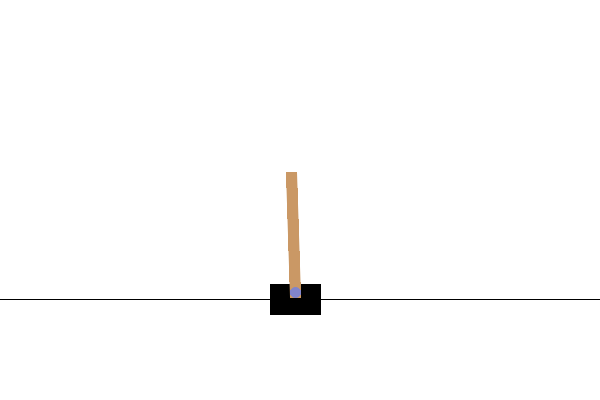

In [146]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(image_file)